## **To recreate study results please load package versions found in main_requirements.txt**

In [ ]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib
import math
import seaborn as sns
import os
# %config IPCompleter.greedy=True
%load_ext autoreload
%autoreload 2

sc.settings.verbosity = 0
sc.logging.print_header()
sns.set_context("paper")

In [2]:
import warnings
warnings.simplefilter( action="ignore", category=FutureWarning)

In [3]:
# import local module containing misc code, helps keep notebooks clean from commonly used functions
import new_misc_code as nmc 

In [4]:
# set paths to directories for data and figures
fig_path = "/dd_userdata/usrdat03/userdata/cherring/data/cellranger_outputs/brain_maturation_RNA/out_figs/"

In [5]:
# read in downsampled count matrices post whole-tissue clustering
adata = sc.read( "../data/post-gaba-wt-clustering.h5ad")
adata

AnnData object with n_obs × n_vars = 154748 × 26747
    obs: 'batch', 'RL#', 'age', 'chem', 'concat_id', 'numerical_age', 'stage_id', 'Sex', 'Race', 'PMI', 'Brain Regions*', 'Cause of Death', 'ICD-10 Code', 'ICD-10 category', 'Oxygen/No Oxygen', 'Date-of-Collection', 'Collection_year', 'Library Prep Date', 'Library Prep Lot', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'doublet_score', 'log10_gene_counts', 'log10_UMI_counts', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden', 'mat/dev', 'cell_type', 'major_clust', 'sub_clust', 'dev_clust', 'downstream_dev_clusts', 'combined-leiden'
    var: 'gene_ids', 'feature_types', 'non-unique_names', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'age_order', 'batch_colors', 'batch_colors_dict', 'batch_order', 'cell_type_colors', 'combined

## **Set sub-clusters to developmental trajectories using manually populated lists in cluster data**

In [6]:
mat_mk = adata.uns['wt_clust_data']['mat/dev']=='mat'
mat_subs = np.unique( adata.uns['wt_clust_data']['dev_clust'][mat_mk])
mat_subs

array(['Astro_GFAP', 'Astro_SLC1A2', 'L2_CUX2_LAMP5', 'L3_CUX2_PRSS12',
       'L4_RORB_LRRK1', 'L4_RORB_MET', 'L4_RORB_MME', 'L5-6_THEMIS_CNR1',
       'L5-6_THEMIS_NTNG2', 'L5-6_TLE4_HTR2C', 'L5-6_TLE4_SCUBE1',
       'L5-6_TLE4_SORCS1', 'Micro', 'OPC', 'OPC_MBP', 'Oligo',
       'Vas_CLDN5', 'Vas_PDGFRB', 'Vas_TBX18'], dtype=object)

In [7]:
def add_dev_traj( cl_dt, ad):
    # get mature clusters
    mat_mk = cl_dt['mat/dev']=='mat'
    mat_subs = np.unique( cl_dt['dev_clust'][mat_mk])
    for mat_itr in mat_subs:
        # get downstream clusters
        ds_itr = cl_dt['downstream_dev_clusts'][cl_dt['dev_clust']==mat_itr].unique()
        # if mature with its own dependency clusters
        if( ds_itr=='root'):
            dev_mk = ad.obs['dev_clust']==mat_itr
        else:
            # assumes downstream_dev_clusts is comma separated
            ds_itr = np.append( ds_itr[0].split(','), mat_itr)
            dev_mk = nmc.member_test( ad.obs['dev_clust'], ds_itr)
        ad.obs[f"{mat_itr}_dev-traj"] = None
        ad.obs.loc[dev_mk,f"{mat_itr}_dev-traj"] = 'dev-traj'
        ad.obs[f"{mat_itr}_dev-traj"] = ad.obs[f"{mat_itr}_dev-traj"].astype('category')
    return( ad)

In [8]:
adata = add_dev_traj( adata.uns['wt_clust_data'], adata)
adata = add_dev_traj( adata.uns['gaba_clust_data'], adata)

In [9]:
# get all dev-trajs to plot
devs = [s for s in adata.obs.columns.values if "dev-traj" in s]
devs = np.sort(devs)
# change color scheme from default
for ii in devs:
    adata.uns[f'{ii}_colors'] = ['#910000','#949494']

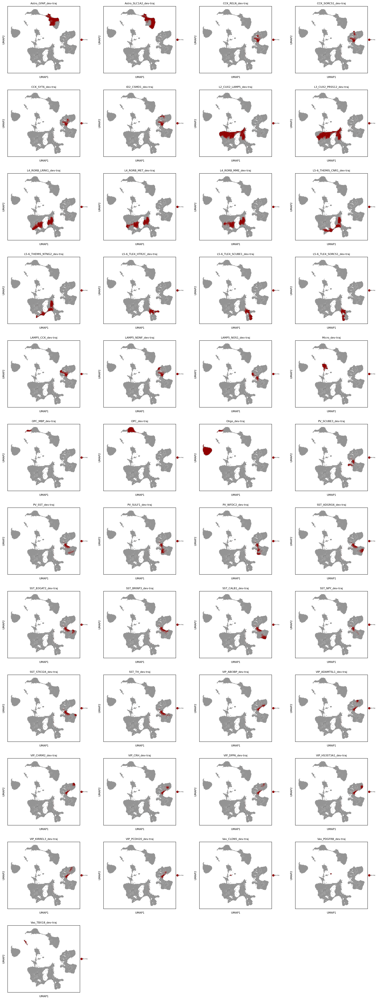

In [10]:
sc.settings.set_figure_params( dpi=100, fontsize=8)
ax = sc.pl.umap( adata, color=devs, legend_fontsize=4, add_outline=True, size=2, legend_fontoutline=0.4, sort_order=True, show=False)

## **Set major clusters and major developmental trajectories using manually populated lists**

In [11]:
ca1_mk = adata.obs['sub_clust']=='LAMP5_NOS1'
scb_mk = np.in1d( adata.obs['sub_clust'], ['PV_SCUBE3','PV_SCUBE3_dev'])
adata.obs['major_clust'] = adata.obs['major_clust'].astype(str)
adata.obs.loc[ca1_mk,'major_clust'] = 'LAMP5_NOS1'
adata.obs.loc[scb_mk,'major_clust'] = 'PV_SCUBE3'
adata.obs['major_clust'] = adata.obs['major_clust'].astype('category')

In [12]:
# set colors used in figures to major clusters
# hex codes for major clusters used else where
nnc = ['#ffc857', '#c6d5c0', '#558140', '#6e0614', '#8b3843', '#a86a72',
       '#c59ba1', '#8eab80', '#ecd1c8', '#484848', '#92afc2', '#255f85',
       '#e2cdd0', '#c77459', '#daa290', '#ffffff', '#b44622', '#1c5701',
       '#a3a3a3']
mj_order = ['Astro', 'CGE_dev', 'ID2', 'L2-3_CUX2', 'L4_RORB', 'L5-6_THEMIS',
            'L5-6_TLE4', 'LAMP5_NOS1', 'MGE_dev', 'Micro', 'OPC', 'Oligo', 'PN_dev',
            'PV', 'PV_SCUBE3', 'Poor-Quality', 'SST', 'VIP', 'Vas']
color_dict = {}
for ii, cc in zip( mj_order, nnc):
    color_dict[ii] = cc

# color dict to use with non scanpy plot palettes
adata.uns['major_clust_colors_dict'] = color_dict
# plot order of clusters
adata.uns['major_clust_plot_order'] = ['L2-3_CUX2', 'L4_RORB', 'L5-6_THEMIS', 'L5-6_TLE4', 'PN_dev',
                                       'VIP', 'ID2', 'LAMP5_NOS1', 'CGE_dev',
                                       'SST', 'PV', 'PV_SCUBE3', 'MGE_dev',
                                       'Astro', 'OPC', 'Oligo', 
                                       'Micro', 'Vas', 'Poor-Quality']
# reorder for scanpy or sns plots
adata.obs['major_clust'] = adata.obs['major_clust'].cat.reorder_categories( adata.uns['major_clust_plot_order']) 
# set colors for scanpy
adata.uns['major_clust_colors'] = [color_dict[ii] for ii in adata.uns['major_clust_plot_order']]

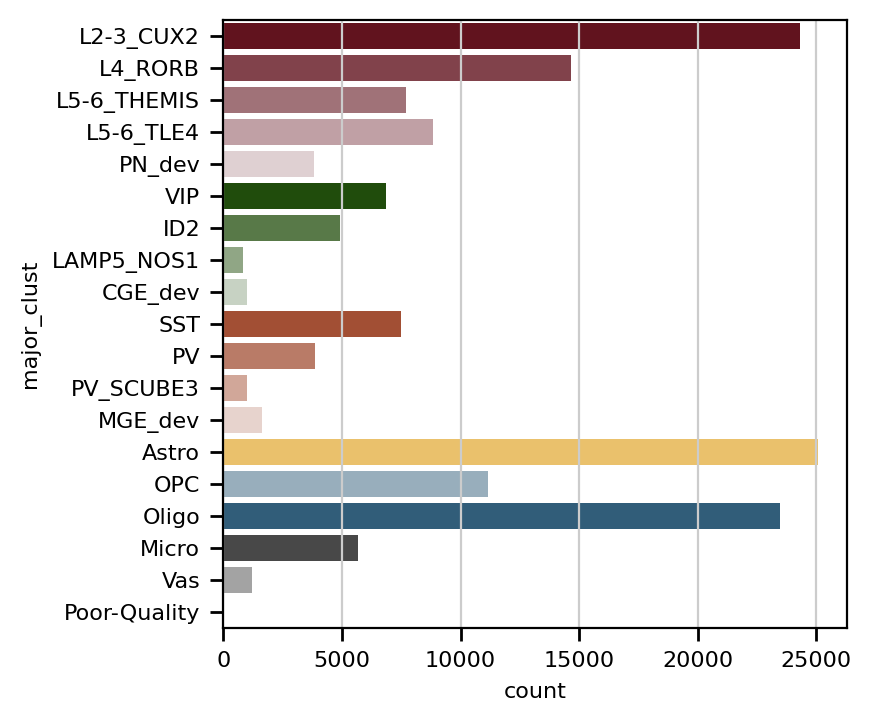

In [13]:
sns.countplot( y='major_clust', 
               data=adata.obs, 
               palette=adata.uns['major_clust_colors_dict']);

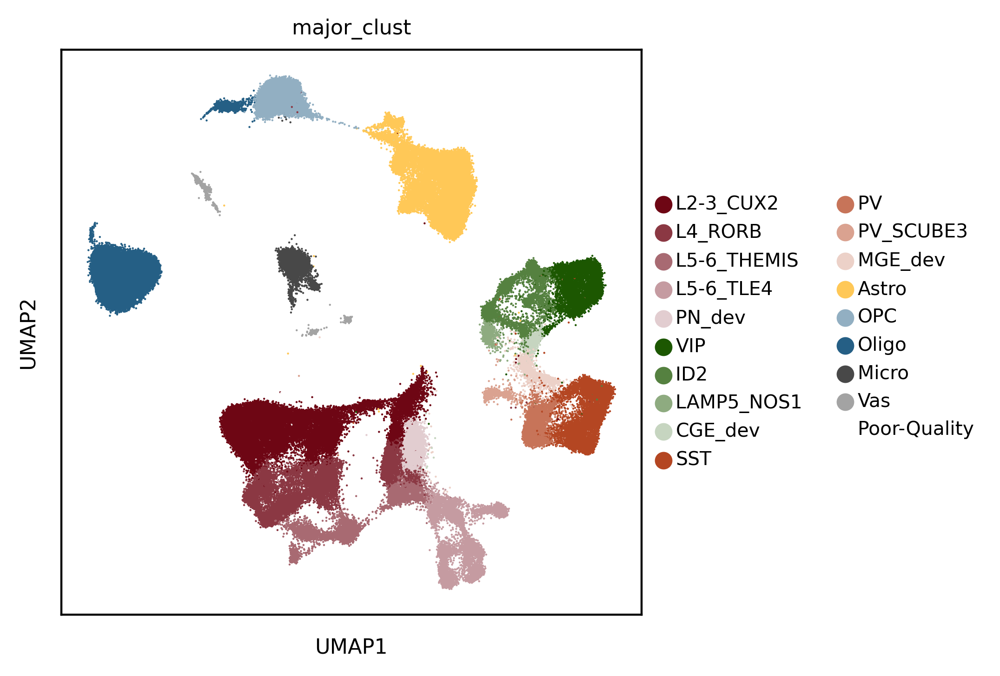

In [14]:
sc.settings.set_figure_params( dpi=200, fontsize=8)
ax = sc.pl.umap( adata, color=['major_clust'], size=2.5, sort_order=False, show=False)

In [15]:
# assign major clusters to developmental trajectories
pns = ['L4_RORB', 'L2-3_CUX2', 'L5-6_TLE4', 'L5-6_THEMIS']
cge = ['VIP', 'ID2']
mge = ['SST', 'PV', 'PV_SCUBE3', 'LAMP5_NOS1']
for mj_itr in adata.obs['major_clust'].unique():
    if mj_itr in pns:
        if mj_itr=='L5-6_TLE4':
            adata.obs[f"mj_dev_traj_{mj_itr}"] = 'None'
            adata.obs.loc[adata.obs['major_clust'].isin([mj_itr]),f"mj_dev_traj_{mj_itr}"] = 'mj_dev_traj'
        else:
            adata.obs[f"mj_dev_traj_{mj_itr}"] = 'None'
            adata.obs.loc[adata.obs['major_clust'].isin([mj_itr,'PN_dev']),f"mj_dev_traj_{mj_itr}"] = 'mj_dev_traj'
    elif mj_itr in mge:
        if mj_itr=='LAMP5_CA1':
            adata.obs[f"mj_dev_traj_{mj_itr}"] = 'None'
            adata.obs.loc[adata.obs['sub_clust'].isin([mj_itr,"MGE_dev-1"]),f"mj_dev_traj_{mj_itr}"] = 'mj_dev_traj'
        else:    
            adata.obs[f"mj_dev_traj_{mj_itr}"] = 'None'
            adata.obs.loc[adata.obs['major_clust'].isin([mj_itr,"MGE_dev"]),f"mj_dev_traj_{mj_itr}"] = 'mj_dev_traj'
    elif mj_itr in cge:
        adata.obs[f"mj_dev_traj_{mj_itr}"] = 'None'
        adata.obs.loc[adata.obs['major_clust'].isin([mj_itr,"CGE_dev"]),f"mj_dev_traj_{mj_itr}"] = 'mj_dev_traj'
    elif mj_itr in ['Astro','OPC','Oligo','Micro','Vas','Poor-Quality']:
        adata.obs[f"mj_dev_traj_{mj_itr}"] = 'None'
        adata.obs.loc[adata.obs['major_clust'].isin([mj_itr]),f"mj_dev_traj_{mj_itr}"] = 'mj_dev_traj'
    else:
        print(mj_itr)
        continue
    # set as cat    
    adata.obs[f"mj_dev_traj_{mj_itr}"] = adata.obs[f"mj_dev_traj_{mj_itr}"].astype('category')

MGE_dev
PN_dev
CGE_dev


In [17]:
# get all dev-trajs to plot
mj_devs = [s for s in adata.obs.columns.values if "mj_dev_traj" in s]
mj_devs = np.sort( mj_devs)
# change color scheme from default
for ii in mj_devs:
    adata.uns[f'{ii}_colors'] = ['#949494','#910000']

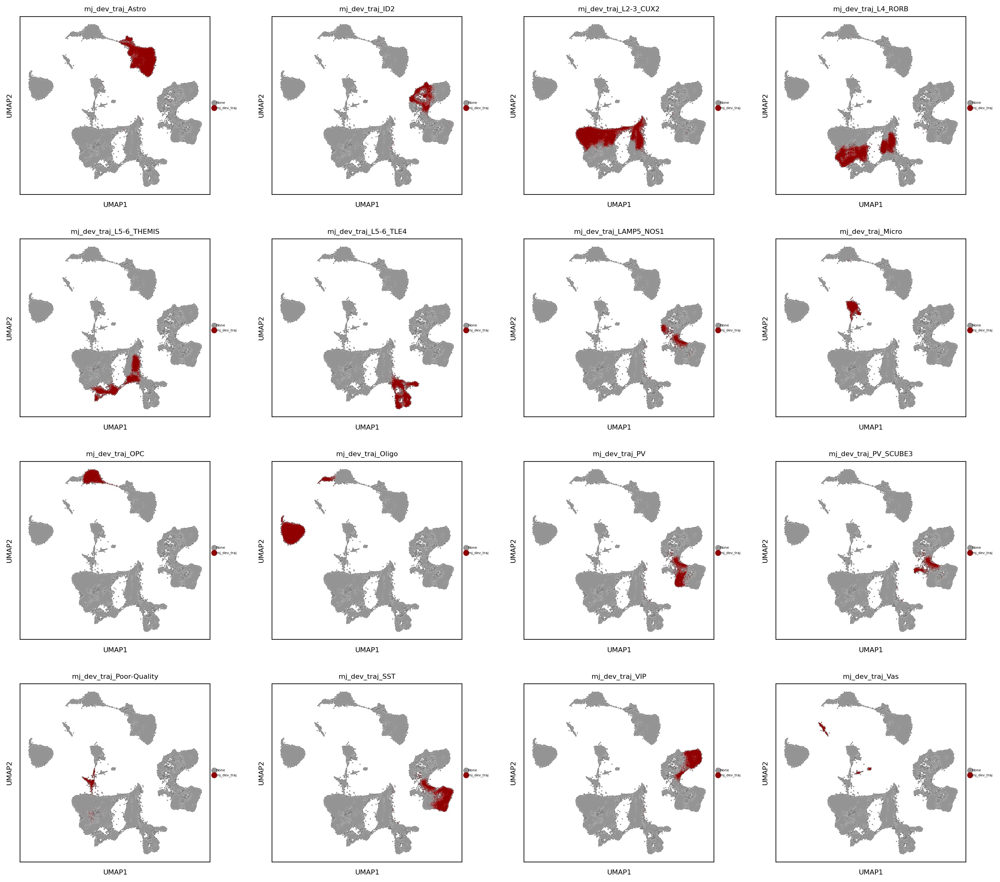

In [18]:
sc.settings.set_figure_params( dpi=100, fontsize=8)
ax = sc.pl.umap( adata, color=mj_devs, legend_fontsize=4, add_outline=True, size=2, legend_fontoutline=0.4, sort_order=True, show=False)

In [19]:
adata.write( "../data/post-gaba-wt-dev-traj.h5ad")